# Important #
** If you are using this in an amazon datascience ami you need to run the following cell and restart the kernel**

In [1]:
!pip install Pillow
!pip install matplotlib

In [2]:
!mkdir -p logs
!mkdir -p data
!mkdir -p model

# Training #
### Loading the files ###
** You need to copy all your files to the directory where you are runing this notebook into a folder named "data" **

In [1]:
import os
import json
import re
numbers = re.compile(r'(\d+)')
data = []
def get_data(root,f):
    d = json.load(open(os.path.join(root,f)))
    if ('pilot/throttle' in d):
        return [d['user/mode'],d['user/throttle'],d['user/angle'],root,d['cam/image_array'],d['pilot/throttle'],d['pilot/angle']]
    else:
        return [d['user/mode'],d['user/throttle'],d['user/angle'],root,d['cam/image_array']]
def numericalSort(value):
    parts = numbers.split(value)
    parts[1::2] = map(int, parts[1::2])
    return parts
for root, dirs, files in os.walk('data'):
    print(root)  # some bad json out there
    data.extend([get_data(root,f) for f in sorted(files, key=numericalSort) if f.startswith('record') and f.endswith('.json')])

data = [d for d in data if d[1] > 0.1]

print(len(data))

data
data/tub_8_18-01-19
8877


### Loading throttle and angle ###

In [2]:
import matplotlib.pyplot as plt
import numpy as np
angle = [d[2] for d in data]
throttle = [d[1] for d in data]
angle_array = np.array(angle)
throttle_array = np.array(throttle)
if (len(data[0]) > 5):
    pilot_angle = [d[6] for d in data]
    pilot_throttle = [d[5] for d in data]
    pilot_angle_array = np.array(pilot_angle)
    pilot_throttle_array = np.array(pilot_throttle)
else:
    pilot_angle = []
    pilot_throttle = []

### Loading images ###

In [3]:
from keras.preprocessing.image import load_img, img_to_array
import numpy as np
images = np.array([img_to_array(load_img(os.path.join(d[3],d[4]))) for d in data],'f')

/Users/az02289/miniconda3/envs/donkey/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


### Start training ###
** You can launch tensorboard to monitor the learning **
` tensorboard --logdir=./logs `

In [6]:
from keras.layers import Input, Dense, merge
from keras.models import Model
from keras.layers import Convolution2D, MaxPooling2D, Reshape, BatchNormalization
from keras.layers import Activation, Dropout, Flatten, Dense
from keras import callbacks

def linear_bin(a):
    a = a + 1
    b = round(a / (2/14))
    arr = np.zeros(15)
    arr[int(b)] = 1
    return arr

logs = callbacks.TensorBoard(log_dir='logs', histogram_freq=0,  
          write_graph=True, write_images=True)
save_best = callbacks.ModelCheckpoint('./model/model_cat', monitor='angle_out_loss', verbose=1, save_best_only=True, mode='min')
early_stop = callbacks.EarlyStopping(monitor='angle_out_loss', 
                                                   min_delta=.0005, 
                                                   patience=10, 
                                                   verbose=1, 
                                                   mode='auto')
img_in = Input(shape=(120, 160, 3), name='img_in')                      # First layer, input layer, Shape comes from camera.py resolution, RGB
x = img_in
x = Convolution2D(24, (5,5), strides=(2,2), activation='relu')(x)       # 24 features, 5 pixel x 5 pixel kernel (convolution, feauture) window, 2wx2h stride, relu activation
x = Convolution2D(32, (5,5), strides=(2,2), activation='relu')(x)       # 32 features, 5px5p kernel window, 2wx2h stride, relu activatiion
x = Convolution2D(64, (5,5), strides=(2,2), activation='relu')(x)       # 64 features, 5px5p kernal window, 2wx2h stride, relu
x = Convolution2D(64, (3,3), strides=(2,2), activation='relu')(x)       # 64 features, 3px3p kernal window, 2wx2h stride, relu
x = Convolution2D(64, (3,3), strides=(1,1), activation='relu')(x)       # 64 features, 3px3p kernal window, 1wx1h stride, relu

# Possibly add MaxPooling (will make it less sensitive to position in image).  Camera angle fixed, so may not to be needed

x = Flatten(name='flattened')(x)                                        # Flatten to 1D (Fully connected)
x = Dense(100, activation='relu')(x)                                    # Classify the data into 100 features, make all negatives 0
x = Dropout(.1)(x)
x = Dense(50, activation='relu')(x)
x = Dropout(.1)(x)                                                      # Randomly drop out 10% of the neurons (Prevent overfitting)
#categorical output of the angle
callbacks_list = [save_best, early_stop, logs]
angle_out = Dense(15, activation='softmax', name='angle_out')(x)        # Connect every input with every output and output 15 hidden units. Use Softmax to give percentage. 15 categories and find best one based off percentage 0.0-1.0

#continous output of throttle
throttle_out = Dense(1, activation='relu', name='throttle_out')(x)      # Reduce to 1 number, Positive number only
angle_cat_array = np.array([linear_bin(a) for a in angle_array])
model = Model(inputs=[img_in], outputs=[angle_out, throttle_out])
model.compile(optimizer='adam',
              loss={'angle_out': 'categorical_crossentropy', 
                    'throttle_out': 'mean_absolute_error'},
              loss_weights={'angle_out': 0.9, 'throttle_out': .001})
model.fit({'img_in':images},{'angle_out': angle_cat_array, 'throttle_out': throttle_array}, batch_size=32, epochs=100, verbose=1, validation_split=0.2, shuffle=True, callbacks=callbacks_list)

Train on 7101 samples, validate on 1776 samples
Epoch 1/100
7101/7101 [==============================] - 65s - loss: 2.0257 - angle_out_loss: 2.2504 - throttle_out_loss: 0.3607 - val_loss: 1.6392 - val_angle_out_loss: 1.8212 - val_throttle_out_loss: 0.1084
Epoch 2/100
7101/7101 [==============================] - 59s - loss: 1.6491 - angle_out_loss: 1.8320 - throttle_out_loss: 0.2430 - val_loss: 1.5471 - val_angle_out_loss: 1.7188 - val_throttle_out_loss: 0.1546
Epoch 3/100
7101/7101 [==============================] - 59s - loss: 1.5196 - angle_out_loss: 1.6882 - throttle_out_loss: 0.1905 - val_loss: 1.4836 - val_angle_out_loss: 1.6483 - val_throttle_out_loss: 0.1143
Epoch 4/100
7101/7101 [==============================] - 59s - loss: 1.4635 - angle_out_loss: 1.6260 - throttle_out_loss: 0.1329 - val_loss: 1.4797 - val_angle_out_loss: 1.6440 - val_throttle_out_loss: 0.0810
Epoch 5/100
7101/7101 [==============================] - 60s - loss: 1.4081 - angle_out_loss: 1.5645 - throttle_out_

7101/7101 [==============================] - 57s - loss: 0.2249 - angle_out_loss: 0.2498 - throttle_out_loss: 0.0441 - val_loss: 4.2516 - val_angle_out_loss: 4.7239 - val_throttle_out_loss: 0.0611
Epoch 41/100
7101/7101 [==============================] - 57s - loss: 0.2003 - angle_out_loss: 0.2225 - throttle_out_loss: 0.0446 - val_loss: 4.1351 - val_angle_out_loss: 4.5944 - val_throttle_out_loss: 0.0639
Epoch 42/100
7101/7101 [==============================] - 57s - loss: 0.2055 - angle_out_loss: 0.2283 - throttle_out_loss: 0.0448 - val_loss: 4.2673 - val_angle_out_loss: 4.7414 - val_throttle_out_loss: 0.0616
Epoch 43/100
7101/7101 [==============================] - 57s - loss: 0.1872 - angle_out_loss: 0.2079 - throttle_out_loss: 0.0486 - val_loss: 4.4071 - val_angle_out_loss: 4.8967 - val_throttle_out_loss: 0.0530
Epoch 44/100
7101/7101 [==============================] - 57s - loss: 0.2095 - angle_out_loss: 0.2327 - throttle_out_loss: 0.0454 - val_loss: 4.1446 - val_angle_out_loss: 4.

# Vizualision #

### Adding plots and comparations ###

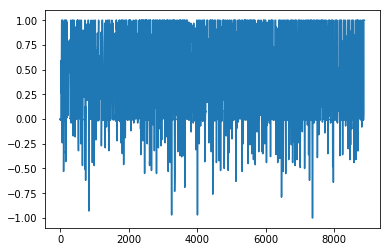

In [4]:
# angles
plt.plot(angle_array)

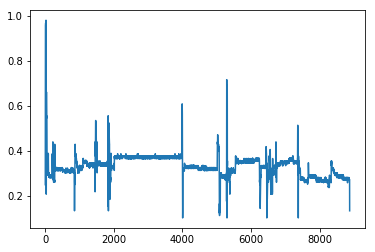

In [21]:
# Speed
plt.plot(throttle_array)

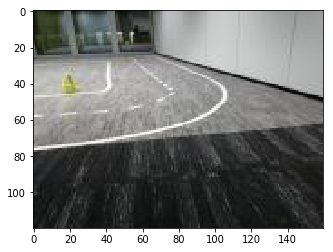

In [9]:
from keras.preprocessing.image import array_to_img
plt.imshow(array_to_img(images[0]))

In [4]:
# finding direction
def get_point(s,start=0,end=160,height= 16):
    X = int(s*((end-start)/2)+(end-start)/2)
    if X < start:
        X = start
    if X > end:
        X = end
    return (X,height)

Building Video


FloatProgress(value=0.0, max=800.0)

Saving mp4
Building HTML animation


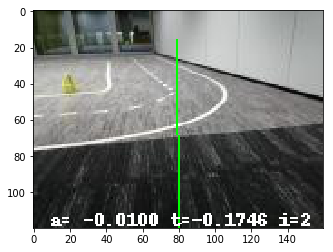

In [11]:
# Make Video of pilot steering/throttle (red) vs trained (green) 
# If you wan complete movie, incomment 'end = len(data)'
import numpy as np
from IPython.display import HTML
from keras.preprocessing.image import array_to_img
from PIL import ImageDraw
import matplotlib.animation as animation
import matplotlib.pyplot as plt
from ipywidgets import FloatProgress
from IPython.display import display

start = 1
end = min(800,len(images))

print("Building Video")
fp = FloatProgress(min=0, max=end)
display(fp)
figure = plt.figure()
imageplot = plt.imshow(np.zeros((120,160, 3), dtype=np.uint8))
val_idx = start
def next_frame(i):
    idx = i + val_idx
    im = array_to_img(images[idx]).copy()
    draw = ImageDraw.Draw(im)
    p = get_point(angle[idx])
    draw.line((80,120, p, p),fill=(0,255,0,128))
    draw.text((10,110),"a= {:01.04f} t={:01.04f} i={}".format(angle[idx], throttle[idx], idx), fill=(255,255,255,128))
    imageplot.set_array(im)
    fp.value += 1
    return imageplot,

animate = animation.FuncAnimation(figure, next_frame, frames=range(start, end), interval=200, blit=False)
print("Saving mp4")
#animate.save("video.mp4")
fp.value=0
print("Building HTML animation")
HTML(animate.to_html5_video())

In [ ]:
# Run local prediction
import numpy as np
import keras


print("Loading model")
model=keras.models.load_model("./models/1101-2-model_linear2")
print("Model Loaded")

print("Starting to predict over datasdet of ", len(data), ' images')

outputs = model.predict(images)
        
print("Prediction done")

Loading model
Model Loaded
Starting to predict over datasdet of  8877  images


In [11]:
# Get predicitons
predicted_angle = outputs[0]
predicted_throttle = outputs[1]

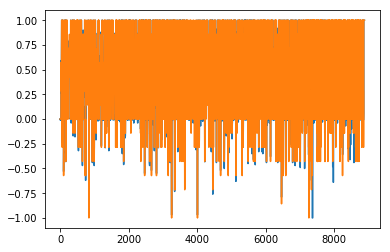

In [12]:
def linear_unbin(arr):
    b = np.argmax(arr)
    a = b *(2/14) - 1
    return a
predicted_angle = [linear_unbin(x) for x in predicted_angle]
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.plot(angle_array)
ax.plot(predicted_angle)

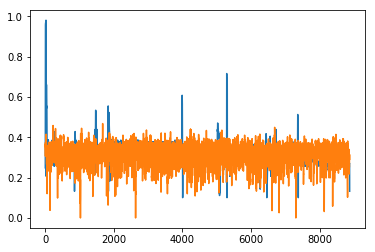

In [13]:
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.plot(throttle_array)
ax.plot(predicted_throttle)

Building Video


FloatProgress(value=0.0, max=800.0)

Saving mp4
Building HTML animation


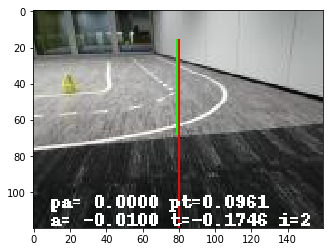

In [16]:
# Make Video of pilot steering/throttle (red) vs trained (green) 
# If you wan complete movie, incomment 'end = len(data)'
import numpy as np
from IPython.display import HTML

import matplotlib.animation as animation
import matplotlib.pyplot as plt
from ipywidgets import FloatProgress
from IPython.display import display

start = 1
end = min(800,len(data))
#end = len(data)
print("Building Video")
fp = FloatProgress(min=0, max=end)
display(fp)
figure = plt.figure()
imageplot = plt.imshow(np.zeros((120,160, 3), dtype=np.uint8))
val_idx = start
def next_frame(i):
    idx = i + val_idx
    im = array_to_img(images[idx]).copy()
    draw = ImageDraw.Draw(im)
    p = get_point(angle[idx])
    draw.line((80,120, p, p),fill=(0,255,0,128))
    pr = get_point(predicted_angle[idx])
    draw.line((80,120, pr, pr),fill=(255,0,0,128)) 
    draw.text((10,100),"pa= {:01.04f} pt={:01.04f}".format(predicted_angle[idx], predicted_throttle[idx][0]), fill=(255,255,255,128))
    draw.text((10,110),"a= {:01.04f} t={:01.04f} i={}".format(angle[idx], throttle[idx], idx), fill=(255,255,255,128))
    imageplot.set_array(im)
    fp.value += 1
    return imageplot,

animate = animation.FuncAnimation(figure, next_frame, frames=range(start, end), interval=200, blit=False)
print("Saving mp4")
#animate.save("video.mp4")
fp.value=0
print("Building HTML animation")
HTML(animate.to_html5_video())
